In [2]:
import pandas as pd

BK_review_df = pd.read_csv('C:/Users/Home/Desktop/DA-project/Final_Project/Bangkok/reviews_BK.csv')
BK_review_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562365 entries, 0 to 562364
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     562365 non-null  int64 
 1   id             562365 non-null  int64 
 2   date           562365 non-null  object
 3   reviewer_id    562365 non-null  int64 
 4   reviewer_name  562359 non-null  object
 5   comments       562294 non-null  object
dtypes: int64(3), object(3)
memory usage: 25.7+ MB


In [3]:
BK_listing_df = pd.read_csv('C:/Users/genhk/Desktop/JDA_Tiffany/JDA/Final_Project/Bangkok/listings_BK.csv')
BK_listing_df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,27934,https://www.airbnb.com/rooms/27934,20250624193503,2025-06-26,city scrape,Nice room with superb city view,Our cool and comfortable one bedroom apartment...,It is very center of Bangkok and easy access t...,https://a0.muscache.com/pictures/566374/23157b...,120437,...,4.91,4.66,4.75,NaN,f,1,1,0,0,0.40
1,27979,https://www.airbnb.com/rooms/27979,20250624193503,2025-06-26,previous scrape,"Easy going landlord,easy place",NaN,NaN,https://a0.muscache.com/pictures/106247594/1d6...,120541,...,NaN,NaN,NaN,NaN,f,2,1,1,0,NaN
2,28745,https://www.airbnb.com/rooms/28745,20250624193503,2025-06-30,previous scrape,modern-style apartment in Bangkok,A modern-style apartment situated in a cool ne...,Ramkumheang neigbourhood - hip place with food...,https://a0.muscache.com/pictures/160369/92a7ec...,123784,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
3,47516,https://www.airbnb.com/rooms/47516,20250624193503,2025-06-28,city scrape,Beautiful waterfront house,NaN,NaN,https://a0.muscache.com/pictures/271998/b090ad...,214456,...,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
4,48736,https://www.airbnb.com/rooms/48736,20250624193503,2025-06-26,city scrape,Condo with Chaopraya River View,at a size of 25sqm for your vacation in BKK.<b...,NaN,https://a0.muscache.com/pictures/12465296/e9c0...,222005,...,5.00,5.00,5.00,NaN,f,1,0,1,0,0.01


In [35]:
BK_listing_sample = BK_listing_df [0:1000]

BK_listing_sample.to_csv('C:/Users/genhk/Desktop/JDA_Tiffany/JDA/Final_Project/Bangkok/listings_BK_sample.csv', index=False)

In [3]:
BK_calendar_df = pd.read_csv('C:/Users/genhk/Desktop/JDA_Tiffany/JDA/Final_Project/Bangkok/calendar_bangkok.csv')

BK_calendar_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10291549 entries, 0 to 10291548
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           float64
 4   adjusted_price  float64
 5   minimum_nights  int64  
 6   maximum_nights  int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 549.6+ MB


# Initial Findings

## Trend

In [37]:
BK_calendar_df['date'] = pd.to_datetime(BK_calendar_df['date'])
BK_calendar_df['year'] = BK_calendar_df['date'].dt.year
BK_calendar_df['month'] = BK_calendar_df['date'].dt.month

BK_calendar_df.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,year,month
0,27934,2025-06-26,f,NaN,NaN,30,240,2025,6
1,27934,2025-06-27,f,NaN,NaN,30,240,2025,6
2,27934,2025-06-28,f,NaN,NaN,30,240,2025,6
3,27934,2025-06-29,t,NaN,NaN,30,240,2025,6
4,27934,2025-06-30,t,NaN,NaN,30,240,2025,6


In [38]:
BK_calendar_df.loc[(BK_calendar_df['year'] == 2025) & (BK_calendar_df['month'] == 7), 'month'] = '2025/7'
BK_calendar_df.loc[(BK_calendar_df['year'] == 2026) & (BK_calendar_df['month'] == 7), 'month'] = '2026/7'
BK_calendar_df

C:\Users\genhk\AppData\Local\Temp\ipykernel_56064\391751846.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2025/7' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  BK_calendar_df.loc[(BK_calendar_df['year'] == 2025) & (BK_calendar_df['month'] == 7), 'month'] = '2025/7'


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,year,month
0,27934,2025-06-26,f,NaN,NaN,30,240,2025,6
1,27934,2025-06-27,f,NaN,NaN,30,240,2025,6
2,27934,2025-06-28,f,NaN,NaN,30,240,2025,6
3,27934,2025-06-29,t,NaN,NaN,30,240,2025,6
4,27934,2025-06-30,t,NaN,NaN,30,240,2025,6
...,...,...,...,...,...,...,...,...,...
10291544,1446221339818908579,2026-06-21,t,NaN,NaN,14,365,2026,6
10291545,1446221339818908579,2026-06-22,t,NaN,NaN,14,365,2026,6
10291546,1446221339818908579,2026-06-23,t,NaN,NaN,14,365,2026,6
10291547,1446221339818908579,2026-06-24,t,NaN,NaN,14,365,2026,6


In [39]:
F_calendar = BK_calendar_df[BK_calendar_df["available"] == 'f']
F_month = F_calendar["month"].value_counts()

# Word Cloud

In [40]:
! pip install wordcloud matplotlib


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


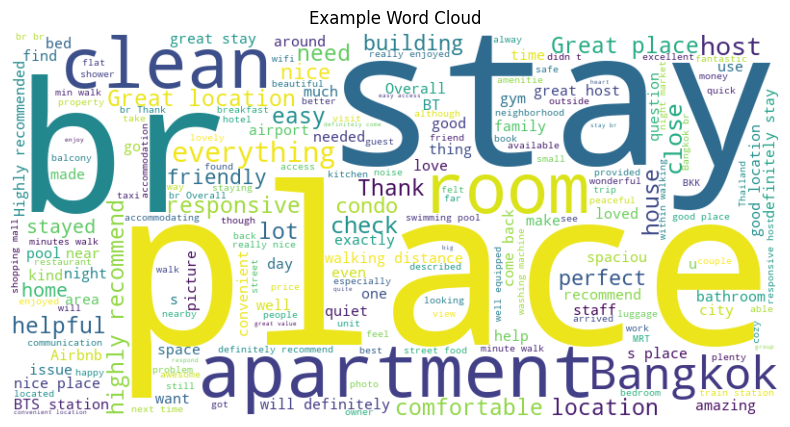

In [41]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(BK_review_df['comments'].dropna().str.cat(sep=' '))

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') # Hide the axes
plt.title("Example Word Cloud")
plt.show()

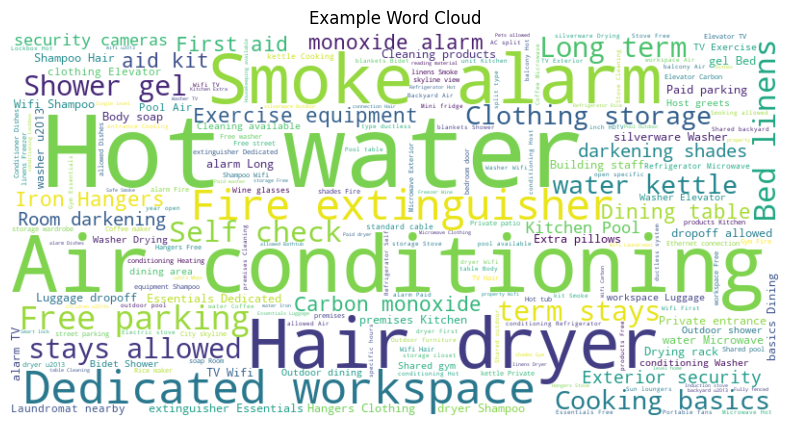

In [42]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(BK_listing_df['amenities'].dropna().str.cat(sep=' '))

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') # Hide the axes
plt.title("Example Word Cloud")
plt.show()

# Review Language

In [ ]:
BK_review_df['date'] = pd.to_datetime(BK_review_df['date'])
BK_review_df['year'] = BK_review_df['date'].dt.year
review_df_20 = BK_review_df[BK_review_df['year'] >= 2020 ]

In [ ]:
review_df_20.info()

<class 'pandas.core.frame.DataFrame'>
Index: 408949 entries, 198 to 562364
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   listing_id     408949 non-null  int64         
 1   id             408949 non-null  int64         
 2   date           408949 non-null  datetime64[ns]
 3   reviewer_id    408949 non-null  int64         
 4   reviewer_name  408943 non-null  object        
 5   comments       408890 non-null  object        
 6   year           408949 non-null  int32         
dtypes: datetime64[ns](1), int32(1), int64(3), object(2)
memory usage: 23.4+ MB


In [ ]:
import pandas as pd
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0

def detect_encoding(text):
    text = str(text)
    print(text[0:10])
    try:
        return detect(text)
    except:
        return 'unknown'

review_df_20['language_encoding'] = review_df_20['comments'].apply(detect_encoding)

Roomy than
It was Ver
Great valu
This place
Pros:<br/>
Fantastic 
This place
Great time
We had a f
Great loca
Great deal
Nice place
Is the bes
I had a wo
Great loca
Good size 
One of the
Great stay
Cozy studi
I stayed a
非常感谢在我grab
Great loca
The apartm
Nice place
super loca
Tor was a 
We had nev
Malisa was
非常好的房东，有问题
Great loca
I had to s
Great comm
Stayed for
The best l
เตียงกว้าง
숙소가 너무 좋아 
This apart
Highly rec
the place 
Perfect lo
Unit is cl
We love to
Great host
Airbnbのメッセ
Host has b
离bts很近，走路不
Great host
Location i
Very, very
We really 
We really 
Wonderful 
很好
so nice pl
The condo 
Very good 
We have st
Accommodat
I like thi
i stayed a
Grear loca
For the pr
처음 체크인부터 숙
Enjoyed ou
great plac
Wenn man i
Good place
호스트가 굉장히 친
Felt right
Tôi đã ở đ
super conv
The accomm
住宿地點非常方便，捷
Got in lat
Excellent 
The host i
Amazing lo
The sky tr
Khun Tor i
henry是个很贴心
청결하고 깨끗하며,
地理位置距离拉加曼加
Great hote
Thank you 
아파트를 원했지만 
Good stay
The hotel 
Cozy hotel
Great stay
The staff 
Great conv
Nice sta

C:\Users\genhk\AppData\Local\Temp\ipykernel_6908\2365878697.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_df_20['language_encoding'] = review_df_20['comments'].apply(detect_encoding)


In [ ]:
review_df_20.info()

<class 'pandas.core.frame.DataFrame'>
Index: 408949 entries, 198 to 562364
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   listing_id         408949 non-null  int64         
 1   id                 408949 non-null  int64         
 2   date               408949 non-null  datetime64[ns]
 3   reviewer_id        408949 non-null  int64         
 4   reviewer_name      408943 non-null  object        
 5   comments           408890 non-null  object        
 6   year               408949 non-null  int32         
 7   language_encoding  408949 non-null  object        
dtypes: datetime64[ns](1), int32(1), int64(3), object(3)
memory usage: 26.5+ MB


In [ ]:
review_df_20.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments,year,language_encoding
198,27934,589850938,2020-01-06,81236740,Wenrong,"Roomy than expected, with one bedroom, one liv...",2020,en
199,27934,1247551387958002555,2024-09-17,597249865,Kuniaki,"It was Very nice person, nice room!<br/>It was...",2024,en
300,4786588,602562135383169069,2022-04-11,68315726,Michael,Great value and great location. Excellent comm...,2022,en
301,4786588,675697320378821339,2022-07-21,1773626,Talisa,This place is conveniently located right on th...,2022,en
302,4786588,692405339424647600,2022-08-13,40393629,Ricky,Pros:<br/>* Host is very quick in solving prob...,2022,en


In [ ]:
review_df_20['language_encoding'].value_counts()

language_encoding
en         271772
zh-cn       31249
ko          23258
fr          16510
de          15037
ja           6254
ru           5242
zh-tw        4753
es           4542
th           3470
so           3251
unknown      2417
ro           2378
nl           2018
it           1940
af           1658
ar           1304
pl           1203
pt           1026
id            938
vi            911
tr            838
cs            809
ca            784
no            741
cy            664
tl            638
sv            555
da            524
he            400
hr            345
fi            309
sw            202
sk            173
hu            144
uk            131
et            126
sl            108
bg             74
el             55
mk             52
lt             42
ur             30
lv             27
fa             27
sq             17
hi              1
bn              1
ta              1
Name: count, dtype: int64

In [ ]:
review_df_20.to_csv('C:/Users/Home/Desktop/DA-project/Final_Project/Bangkok/BK_reviews_with_encoding.csv', index=False)

In [ ]:
eng_review = review_df_20[review_df_20['language_encoding'] == 'en']
eng_review.to_csv('C:/Users/Home/Desktop/DA-project/Final_Project/Bangkok/eng_review.csv', index=False)

non_eng = review_df_20[review_df_20['language_encoding'] != 'en']
non_eng.to_csv('C:/Users/Home/Desktop/DA-project/Final_Project/Bangkok/non_eng.csv', index=False)

# Comment > word pair Frequency 

In [ ]:
import pandas as pd 
eng_review = pd.read_csv('C:/Users/genhk/Desktop/JDA_Tiffany/JDA/Final_Project/Bangkok/eng_review.csv')

In [ ]:
! pip install nltk


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
eng_review

,Unnamed: 0,listing_id,id,date,reviewer_id,reviewer_name,comments,year,language_encoding,clean_text
0,0,27934,589850938,2020-01-06,81236740,Wenrong,"Roomy than expected, with one bedroom, one liv...",2020,en,Roomy expected one bedroom one living room kic...
1,1,27934,1247551387958002555,2024-09-17,597249865,Kuniaki,"It was Very nice person, nice room!<br/>It was...",2024,en,nice person nice roomIt great
2,2,4786588,602562135383169069,2022-04-11,68315726,Michael,Great value and great location. Excellent comm...,2022,en,Great value great location Excellent communica...
3,3,4786588,675697320378821339,2022-07-21,1773626,Talisa,This place is conveniently located right on th...,2022,en,place conveniently located right main road min...
4,4,4786588,692405339424647600,2022-08-13,40393629,Ricky,Pros:<br/>* Host is very quick in solving prob...,2022,en,Pros Host quick solving problems providing sup...
...,...,...,...,...,...,...,...,...,...,...
271767,408939,1443921857744573442,1451242512737984735,2025-06-25,387283597,Tamer,"Nice place to stay, recommended",2025,en,Nice place stay recommended
271768,408941,1443945800163684056,1454103635733077676,2025-06-29,561002931,Somphop,"highly reccommend, beautiful place, and very n...",2025,en,highly reccommend beautiful place nice host in...
271769,408945,1444062790313784171,1451296915609549448,2025-06-25,585812377,Katie,Great location. Easy for getting around the city.,2025,en,Great location Easy getting around city
271770,408947,1445014333389609399,1448376883865228628,2025-06-21,580895913,Binghua,"The landlord is very nice, the room is big, th...",2025,en,landlord nice room big kitchen cooking equippe...


In [ ]:
! pip install rake-nltk pytextrank

^C


  Using cached mdurl-0.1.2-py3-none-any.whl.metadata (1.6 kB)
   ---------------------------------------- 0.0/13.9 MB ? eta -:--:--
    --------------------------------------- 0.3/13.9 MB ? eta -:--:--
   -- ------------------------------------- 0.8/13.9 MB 2.0 MB/s eta 0:00:07
   --- ------------------------------------ 1.3/13.9 MB 2.2 MB/s eta 0:00:06
   ----- ---------------------------------- 1.8/13.9 MB 2.4 MB/s eta 0:00:06
   ------- -------------------------------- 2.6/13.9 MB 2.6 MB/s eta 0:00:05
   --------- ------------------------------ 3.4/13.9 MB 2.9 MB/s eta 0:00:04
   ------------ --------------------------- 4.2/13.9 MB 3.0 MB/s eta 0:00:04
   --------------- ------------------------ 5.2/13.9 MB 3.3 MB/s eta 0:00:03
   ------------------ --------------------- 6.3/13.9 MB 3.5 MB/s eta 0:00:03
   --------------------- ------------------ 7.6/13.9 MB 3.7 MB/s eta 0:00:02
   ------------------------- -------------- 8.9/13.9 MB 3.9 MB/s eta 0:00:02
   -------------------------


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
! python -m spacy download en_core_web_sm

  ERROR: HTTP error 403 while getting https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl

[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: Could not install requirement en-core-web-sm==3.8.0 from https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl because of HTTP error 403 Client Error: Forbidden for url: https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl for URL https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl


## split words

In [45]:

import spacy.cli
spacy.cli.download("en_core_web_sm")



import spacy
nlp = spacy.load("en_core_web_sm")


✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [46]:

import pandas as pd
from rake_nltk import Rake
import spacy
import nltk
import pytextrank

# nltk.download('all')

# 建立 spaCy 模型並加入 TextRank
nlp = spacy.load("en_core_web_sm")
nlp.add_pipe("textrank")


# TextRank 關鍵字提取
def extract_textrank_keywords(text):
    doc = nlp(text)
    return ', '.join([phrase.text for phrase in doc._.phrases[:5]])

eng_review['textrank_keywords'] = eng_review['clean_text'][50:70].apply(extract_textrank_keywords)

# 顯示結果
eng_review[['comments','clean_text', 'textrank_keywords']][50:70]



,comments,clean_text,textrank_keywords
50,We have stayed at Emmie's place many times. I...,stayed Emmies place many times nice see made u...,"great minute BTS Nut station shopping mall, du..."
51,Accommodating and responsive host,Accommodating responsive host,Accommodating responsive host
52,I like this place it’s close to everything and...,like place close everything convenient us,"place, everything, us"
53,i stayed at emmie's place for 6 weeks. locatio...,stayed emmies place weeks location perfect min...,"first nights noise, emmies place, weeks locati..."
54,Grear location. Too loud mainly for mototbikes...,Grear location loud mainly mototbikes tuk tuks...,"tuk tuks Trains, disgunting sound love owner, ..."
55,For the price this is a really good value. 2Br...,price really good value Br directly bts entran...,"entrance Note, due main road otherwise locatio..."
56,"Enjoyed our stay, great location right beside ...",Enjoyed stay great location right beside sky t...,"sky train, great location"
57,"great place, amazing location, Highest recomme...",great place amazing location Highest recommend...,"great place amazing location, Highest, everybody"
58,"Good place , clean and host is easy to communi...",Good place clean host easy communicate,"clean host, Good place"
59,"Felt right at home in Emmie's airbnb, and the ...",Felt right home Emmies airbnb hosts friendly r...,"Felt right home Emmies airbnb hosts, friendly ..."


In [47]:

from rake_nltk import Rake


def extract_rake_keywords(text):
    rake = Rake()
    rake.extract_keywords_from_text(text)
    return ', '.join(rake.get_ranked_phrases())

eng_review['rake_keywords'] = eng_review['clean_text'][50:70].apply(extract_rake_keywords)
eng_review[['comments','clean_text', 'rake_keywords']][50:70]



,comments,clean_text,rake_keywords
50,We have stayed at Emmie's place many times. I...,stayed Emmies place many times nice see made u...,stayed emmies place many times nice see made u...
51,Accommodating and responsive host,Accommodating responsive host,accommodating responsive host
52,I like this place it’s close to everything and...,like place close everything convenient us,like place close everything convenient us
53,i stayed at emmie's place for 6 weeks. locatio...,stayed emmies place weeks location perfect min...,stayed emmies place weeks location perfect min...
54,Grear location. Too loud mainly for mototbikes...,Grear location loud mainly mototbikes tuk tuks...,grear location loud mainly mototbikes tuk tuks...
55,For the price this is a really good value. 2Br...,price really good value Br directly bts entran...,price really good value br directly bts entran...
56,"Enjoyed our stay, great location right beside ...",Enjoyed stay great location right beside sky t...,enjoyed stay great location right beside sky t...
57,"great place, amazing location, Highest recomme...",great place amazing location Highest recommend...,great place amazing location highest recommend...
58,"Good place , clean and host is easy to communi...",Good place clean host easy communicate,good place clean host easy communicate
59,"Felt right at home in Emmie's airbnb, and the ...",Felt right home Emmies airbnb hosts friendly r...,felt right home emmies airbnb hosts friendly r...


In [48]:
! pip install jieba.analyse

ERROR: Could not find a version that satisfies the requirement jieba.analyse (from versions: none)

[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for jieba.analyse


In [51]:
def lemmatize_with_spacy(text):
    if not isinstance(text, str):
        return ''
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

eng_review['lemmatized_text'] = eng_review['clean_text'].apply(lemmatize_with_spacy)

eng_review[['clean_text', 'lemmatized_text']]

,clean_text,lemmatized_text
0,Roomy expected one bedroom one living room kic...,roomy expect one bedroom one living room kicke...
1,nice person nice roomIt great,nice person nice roomit great
2,Great value great location Excellent communica...,great value great location excellent communica...
3,place conveniently located right main road min...,place conveniently locate right main road min ...
4,Pros Host quick solving problems providing sup...,Pros Host quick solve problem provide support ...
...,...,...
271767,Nice place stay recommended,nice place stay recommend
271768,highly reccommend beautiful place nice host in...,highly reccommend beautiful place nice host in...
271769,Great location Easy getting around city,great location Easy get around city
271770,landlord nice room big kitchen cooking equippe...,landlord nice room big kitchen cooking equip w...


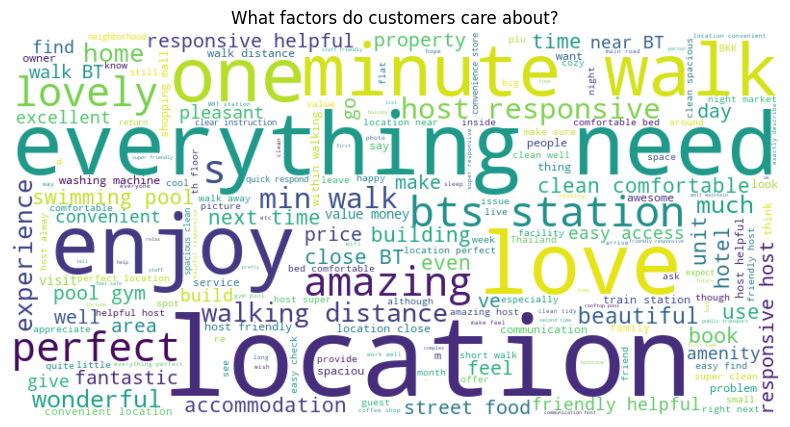

In [52]:
from wordcloud import STOPWORDS

# Add custom stopwords
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(['highly', 'recommend', 'nice', 'great', 'good', 'stay', 'really', 'definitely', 'Thank', 'enjoyed', 'overall', 'recommended', 'come','back', 'place', 'Bangkok', 'Airbnb', 'house', 'apartment', 'cando', 'condo', 'room' ])

# Generate a new word cloud with updated stopwords
filtered_wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    stopwords=custom_stopwords
).generate(eng_review['lemmatized_text'].dropna().str.cat(sep=' '))

plt.figure(figsize=(10, 5))
plt.imshow(filtered_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("What factors do customers care about?")
plt.show()